In [96]:
%matplotlib inline

import os 
import time
import librosa
import IPython
import librosa.display
import importlib
import matplotlib
import numpy as np
import string as strp
import pr_util as util
import matplotlib.pyplot as plt

import my_display as dp

from scipy import signal, ndimage

importlib.reload(util)

<module 'pr_util' from '/var/tmp/ff/tcc/code/pr_util.py'>

In [5]:
most3 = util.return_n_most_frequent_species(3, 'song')
alldir = util.return_n_most_frequent_species(100, 'song')
e1 = util.return_random_audio([most3[0]])
e2 = util.return_random_audio([most3[1]])
e3 = util.return_random_audio([most3[2]])

In [61]:
y1 = []
y2 = []
y3 = []
for (d1, d2, d3) in zip(e1, e2, e3):
    y1.append(librosa.load(d1)[0])
    y2.append(librosa.load(d2)[0])
    y3.append(librosa.load(d3)[0])

In [144]:
def play_array(ys):
    sinewave = np.sin(np.linspace(0, 800*np.pi, 10000))
    data = sinewave
    for y in ys:
        data = np.concatenate((data, y, sinewave))
    return data

In [126]:
y_all = [y1, y2, y3]

In [70]:
data = play_array(y1)
IPython.display.Audio(data = data, rate = 22050)

In [71]:
data = play_array(y2)
IPython.display.Audio(data = data, rate = 22050)

In [72]:
data = play_array(y3)
IPython.display.Audio(data = data, rate = 22050)

In [131]:
#print(y1)
mfccs1 = [librosa.feature.mfcc(y=y, sr=22050) for y in y1]
mfccs2 = [librosa.feature.mfcc(y=y, sr=22050) for y in y2]
mfccs3 = [librosa.feature.mfcc(y=y, sr=22050) for y in y3]

all_mfccs = [mfccs1, mfccs2, mfccs3]

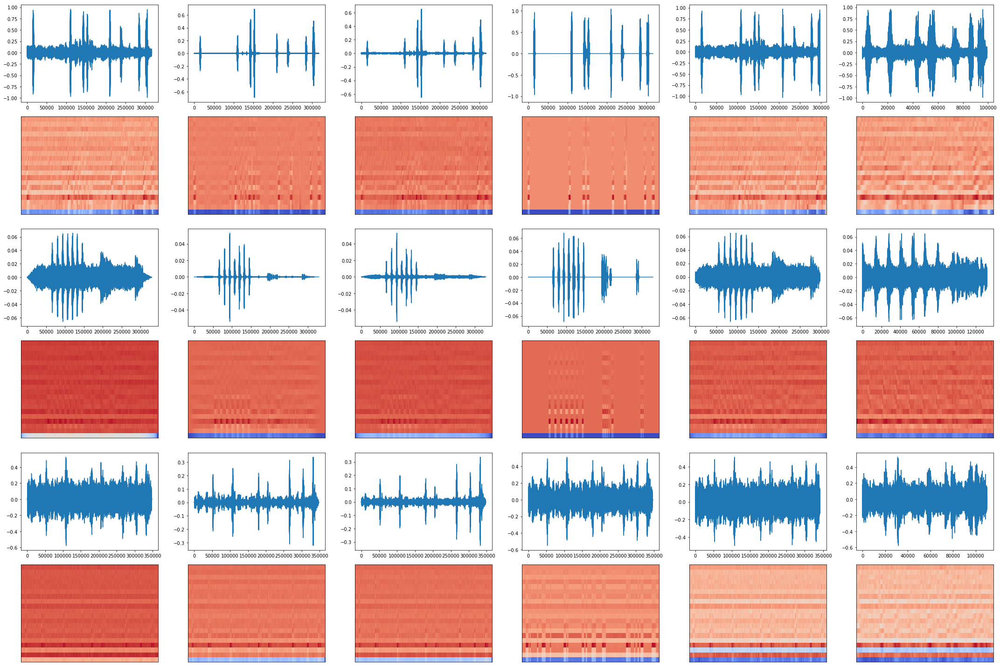

In [134]:
#fig, ax = plt.subplots(nrows=6, ncols=6, figsize=(30,20))

#ax = ax.ravel()

plt.figure(figsize=(30,20))

n_lin = 6
n_col = 6

for i in range(n_lin):
    for j in range(n_col):
        n_fig = i * n_col + (j + 1)
        ax1 = plt.subplot(n_lin, n_col, n_fig)
        if i%2 == 0:
            ax1.plot(y_all[int(i/2)][j])
        else:
            librosa.display.specshow(all_mfccs[int(i/2)][j])

plt.tight_layout()

In [192]:
def plot_audio_with_feature(dirs, n_species, n_audios, feat, **kwargs):
    #dirs = util.return_n_most_frequent_species(n_species, 'song')
    
    all_files = []
    all_feat = []
    
    for i in range(n_species):
        files = []
        for j in range(n_audios):
            ind_dir = i*n_audios + j
            print(ind_dir)
            #print(dirs[ind_dir])
            rec, sr = librosa.load(dirs[ind_dir], sr=22050)
            #print(rec)
            files.append(rec)
            #print(files)
        all_files.append(files)
    '''   
    for dir in dirs:
        files = []
        for i in range(n_audios):
            rec_dir = util.return_random_audio([dir])[0]
            rec, sr = librosa.load(rec_dir, sr = 22050)
            files.append(rec)
        all_files.append(files) '''
        
    for spc in all_files:
        feat_tmp = []
        for audio in spc:
            feat_tmp.append(feat(audio, **kwargs))
        all_feat.append(feat_tmp)
        
        
    plt.figure(figsize=(30,20))

    n_lin = n_species*2
    n_col = n_audios

    for i in range(n_lin):
        for j in range(n_col):
            n_fig = i * n_col + (j + 1)
            ax1 = plt.subplot(n_lin, n_col, n_fig)
            if i%2 == 0:
                ax1.plot(all_files[int(i/2)][j])
            else:
                librosa.display.specshow(all_feat[int(i/2)][j])

    plt.tight_layout() 



In [175]:
def return_audio_dir(n_species, n_audio):
    dirs = util.return_n_most_frequent_species(n_species, 'song')
    audio_dir = []
    for dir in dirs:
        for i in range(n_audio):
            spc_dir = util.return_random_audio([dir])[0]
            audio_dir.append(spc_dir)
    return audio_dir


In [190]:
n_species = 3
n_audio = 6
dirs = return_audio_dir(n_species, n_audio)

kwargs = {
    'sr' : 22050
}

for d in dirs:
    print(d)

/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/BLACKBIRD%20Chopi_10_Estancia%20Rincon%20del%20Socorro_Mercedes_Corrientes_AR_25OCT00_Rosendo%20Fraga.mp3
/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/1000503.mp3
/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/Gnorimosparchopichorus.mp3
/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/Gnorimopsar%20chopi.mp3
/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/Gnorchop01.mp3
/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/Gnorimopsar%20chopi0606-1.mp3
/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-4/Sittasomus griseicapillus/song/100258.mp3
/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-4/Sittasomus griseicapillus/song/SITGRI02.mp3
/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-4/Sittasomus griseicapillus/song/Olivaceous%20Woodcreeper.mp3
/var/tmp/ff/tcc/

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17


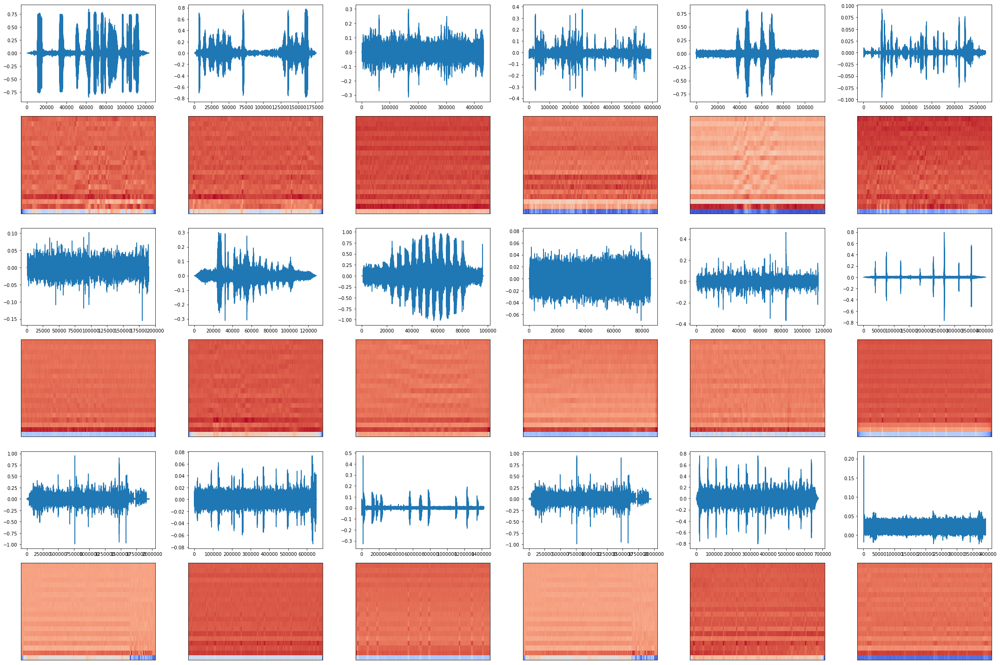

In [193]:
plot_audio_with_feature(dirs, n_species, n_audio, librosa.feature.mfcc, **kwargs)

In [194]:
def mfcc_norm(y, **kwargs):
    y = y/y.max()
    return librosa.feature.mfcc(y, **kwargs)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17


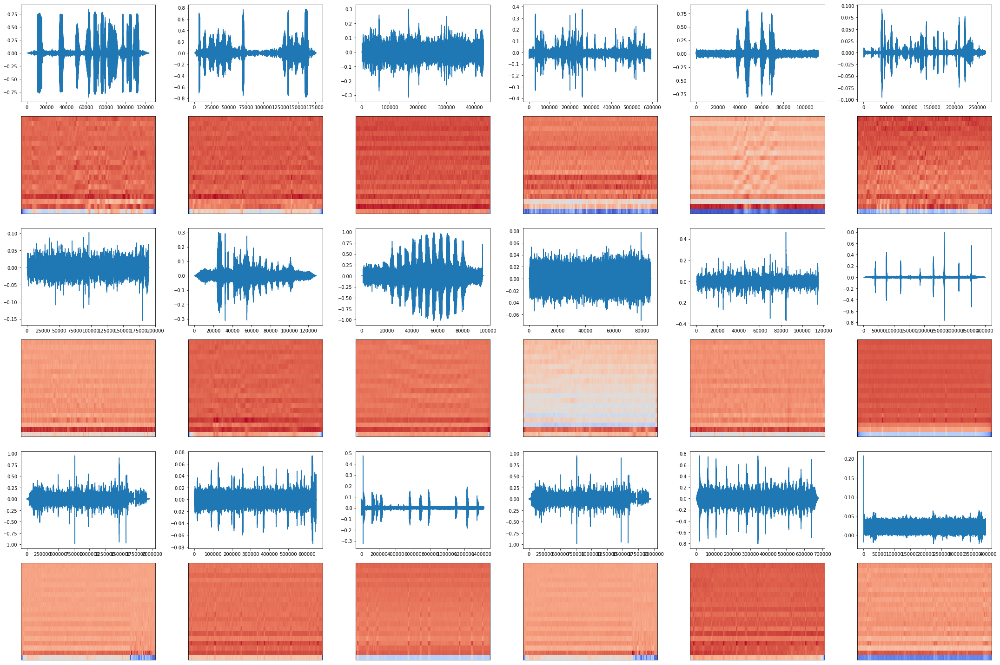

In [195]:
plot_audio_with_feature(dirs, n_species, n_audio, mfcc_norm, **kwargs)